# Source Code Analysis

## Initialization

In [1]:
import os
import sys

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)
        sys.path.append(path)    
add_path('/home/jjian03/anaconda3/lib/python3.7/site-packages')
add_path('/home/jjian03/iconference_followup_study')


### Load Data

In [2]:
from lib.Repository import *
from lib.Utility import *
from lib.modeling import *
from lib.preprocessing import *
from lib.preprocessing.HTMLParser import html_parser
from lib.viz import *

Allocated 16 CPUs


In [3]:
import time
import datetime
start_time = time.time()
raw_data = DataSource(job_name='lasso_untruncated', cache_name = 'untrunc_data.csv', truncated=False, fract=.003).raw_data

raw_data.info()

print(f'raw_data: {shape(raw_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Sample Size - raw_data: 58949
Initialized
<class 'pandas.core.frame.DataFrame'>
Int64Index: 58949 entries, 0 to 58948
Data columns (total 36 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   id                                      58949 non-null  object 
 1   url                                     58949 non-null  object 
 2   actual_scrape_url                       58949 non-null  object 
 3   first_appear                            58949 non-null  int64  
 4   first_available_timestamp               0 non-null      float64
 5   last_available_timestamp                17542 non-null  float64
 6   header                                  58949 non-null  object 
 7   html_text                               58949 non-null  object 
 8   comment                                 58949 non-null  object 
 9   from_waybackmachine                     58949 non-null  int64  
 10  http_status_code

### Train Test Split

In [4]:
start_time = time.time()

train_data = DataSource().train_data
test_data = DataSource().test_data


print('Shape of the dataframe:')
print(f'train_data: {shape(train_data)}')
print(f'test_data: {len(test_data)}')

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Shape of the dataframe:
train_data: (41264, 36)
test_data: 17685
--- 00 minutes, 0.01 seconds ---


In [5]:
display(pd.DataFrame({
    'unique count': print_unique_count(train_data),
    'na count': print_na_count(train_data)
}, index=train_data.columns))

,unique count,na count
id,40862,0
url,40862,0
actual_scrape_url,40858,0
first_appear,21,0
first_available_timestamp,1,41264
last_available_timestamp,10837,29029
header,40837,0
html_text,34680,0
comment,928,0
from_waybackmachine,2,0


## Modeling

### Elastic Net Regression

#### 1st Edition - Combine suffix dummy with MAG

In [6]:
from feature_engine import categorical_encoders


pipe = Pipeline([
    ('label_builder', LabelBuilder()),
    ('url_parser', URLParser()),
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('binary_na_encoder', BinaryNAEncoder(['content_type'])),
    ('html_parser', html_parser),
    ('binary_feature_converter', FeatureValueMapper('protocol_type', {
                                        'http': 1,
                                        'https':0,
                                        })),

    ('nan_to_Zero_converter', NanToZeroConverter([
        'total_num_of_paper_citing',
        'total_num_of_author_citing',
        'total_num_of_affiliation_citing',
        'total_num_of_journal_citing',
        'total_num_of_author_self_citation',
        'total_num_of_affiliation_self_citation',
        'total_num_of_journal_self_citation',
        'avg_year',
        'min_year',
        'max_year',
        'median',
        'num_of_author',
        'num_of_author_citing',
        'num_of_affiliation_citing',
        'num_of_journal_citing',
        'avg_hindex',
        'first_author_hindex',
        'last_author_hindex',
        'avg_mid_author_hindex',
        'paper_unique_affiliation'
    ])),
    
    ('feature_picker', FeaturePicker([
                                        'protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'is_port_access',
                                        'code_size',
                                        'title_length',
                                        'internal_js_cnt',
                                        'external_js_cnt',
                                        'charset',
                                        'is_html5',
                                        'has_iframe',
                                        'hyperlink_cnt',

                                        'total_num_of_paper_citing',
                                        'total_num_of_author_citing',
                                        'total_num_of_affiliation_citing',
                                        'total_num_of_journal_citing',
                                        'total_num_of_author_self_citation',
                                        'total_num_of_affiliation_self_citation',
                                        'total_num_of_journal_self_citation',
                                        'avg_year',
                                        'min_year',
                                        'max_year',
                                        'median',
                                        'num_of_author',
                                        'num_of_author_citing',
                                        'num_of_affiliation_citing',
                                        'num_of_journal_citing',
                                        'avg_hindex',
                                        'first_author_hindex',
                                        'last_author_hindex',
                                        'avg_mid_author_hindex',
                                        'paper_unique_affiliation',

                                        'label',
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),

    ('feature_remover', FeatureRemover([
                                        'is_port_access',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['charset'])),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train = pipe.fit_transform(DataSource().train_data)
y_train = X_train.label
X_train = X_train.drop('label', axis=1)
print(X_train.columns)

X_test = pipe.fit_transform(DataSource().test_data)
y_test = X_test.label
X_test = X_test.drop('label', axis=1)
print(X_test.columns)


train = X_train.copy()
train.loc[:,'label'] = y_train
test = X_test.copy()
test.loc[:,'label'] = y_test


Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'kr', 'url_depth', 'subdomain_level', 'param_cnt',
       'title_length', 'internal_js_cnt', 'external_js_cnt', 'charset',
       'hyperlink_cnt', 'total_num_of_paper_citing',
       'total_num_of_author_citing', 'total_num_of_affiliation_citing',
       'total_num_of_journal_citing', 'total_num_of_author_self_citation',
       'total_num_of_affiliation_self_citation',
       'total_num_of_journal_self_citation', 'avg_year', 'min_year',
       'max_year', 'median', 'num_of_author', 'num_of_author_citing',
       'num_of_affiliation_citing', 'num_of_journal_citing', 'avg_hindex',
       'first_author_hindex', 'last_author_hindex', 'avg_mid_author_hindex',
       'paper_unique_affiliation'],
      dtype='object')
Index(['protocol_type', 'has_www', 'has_iframe', 'int', 'org', 'gov', 'in',
       'eu', 'cn', 'kr', 'url_depth', 'subdomain_level', 'param_cnt',
       'title_length', 'internal_js_cn

In [7]:
import numpy as np
from sklearn.linear_model import ElasticNet


start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 16.67%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9793,0.045,87.722,0.000
protocol_type,1.5724,0.034,46.865,0.000
total_num_of_paper_citing,0.5474,0.084,6.532,0.000
num_of_author_citing,0.4713,0.049,9.602,0.000
title_length,0.2439,0.014,17.553,0.000
has_www,0.2027,0.030,6.763,0.000
total_num_of_author_self_citation,0.1565,0.021,7.415,0.000
gov,0.1206,0.040,3.037,0.002
avg_year,0.1014,1.052,0.096,0.923
int,0.0979,0.072,1.362,0.173



R^2 on Testing Set: 16.49%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9793,0.070,57.112,0.000
protocol_type,1.5724,0.051,30.662,0.000
total_num_of_paper_citing,0.5474,0.117,4.661,0.000
num_of_author_citing,0.4713,0.108,4.381,0.000
title_length,0.2439,0.021,11.500,0.000
has_www,0.2027,0.046,4.407,0.000
total_num_of_author_self_citation,0.1565,0.033,4.793,0.000
gov,0.1206,0.061,1.978,0.048
avg_year,0.1014,1.543,0.066,0.948
int,0.0979,0.110,0.890,0.373


--- 02 minutes, 8.59 seconds ---


In [8]:
Visualizer.plot_distribution(pd.DataFrame({
    'residual': result_train.best_result.residual
}), "Residual Distribution", height=400)

In [9]:
residual_df_train = pd.DataFrame({
    'title': 'Training Set',
    'residual': result_train.best_result.residual,
    'prediction': result_train.best_result.pred,
})
residual_df_test = pd.DataFrame({
    'title': 'Testing Set',
    'residual': result_test.best_result.residual,
    'prediction': result_test.best_result.pred,
})

residual_df = residual_df_train.copy().append(residual_df_test)

Visualizer.plot_residual(residual_df)


In [10]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 02 minutes, 21.26 seconds ---


In [11]:
def build_visualization_matrix(result_train, result_test):
    performance_matrix_train = pd.DataFrame()
    performance_matrix_train['alpha'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_train['mse'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_train['r_2'] = pd.Series(result_train.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_train[col_name] = pd.Series(result_train.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_train['type'] = 'Train'

    performance_matrix_test = pd.DataFrame()
    performance_matrix_test['alpha'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.params['alpha'][0])
    performance_matrix_test['mse'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.mse)
    performance_matrix_test['r_2'] = pd.Series(result_test.performance_matrix).apply(lambda x: x.r_2)
    for col_name in result_train.performance_matrix[0].rpt.index.tolist():
        performance_matrix_test[col_name] = pd.Series(result_test.performance_matrix).apply(lambda x: x.rpt.loc[col_name, 'Coefficients'])
    performance_matrix_test['type'] = 'Test'

    performance_matrix = pd.DataFrame()
    performance_matrix = performance_matrix.append(performance_matrix_train)
    performance_matrix = performance_matrix.append(performance_matrix_test)

    return performance_matrix

performance_matrix = build_visualization_matrix(result_train, result_test)

In [12]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [13]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 432x288 with 0 Axes>

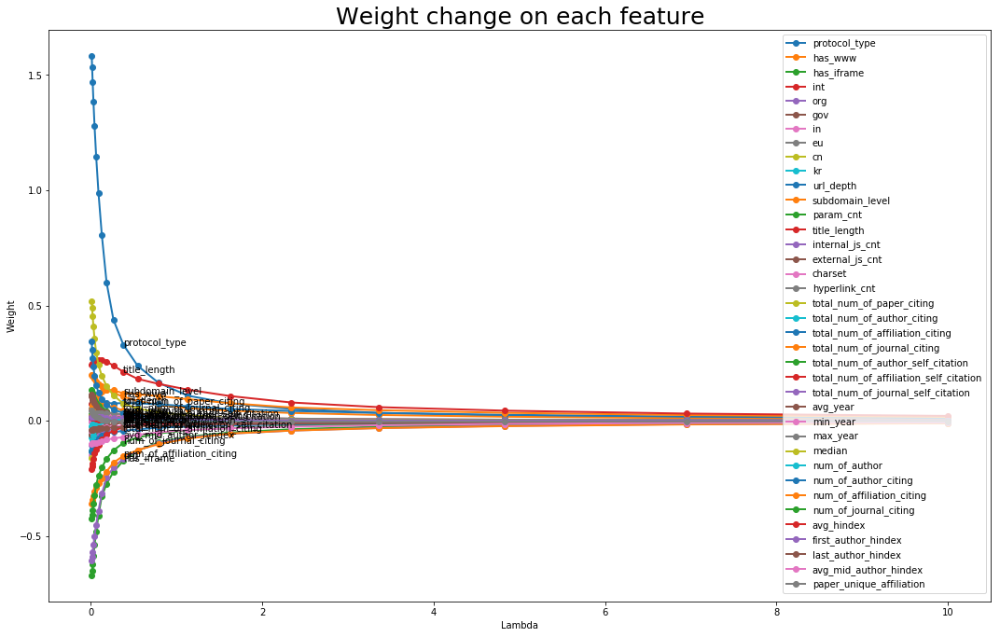

In [14]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

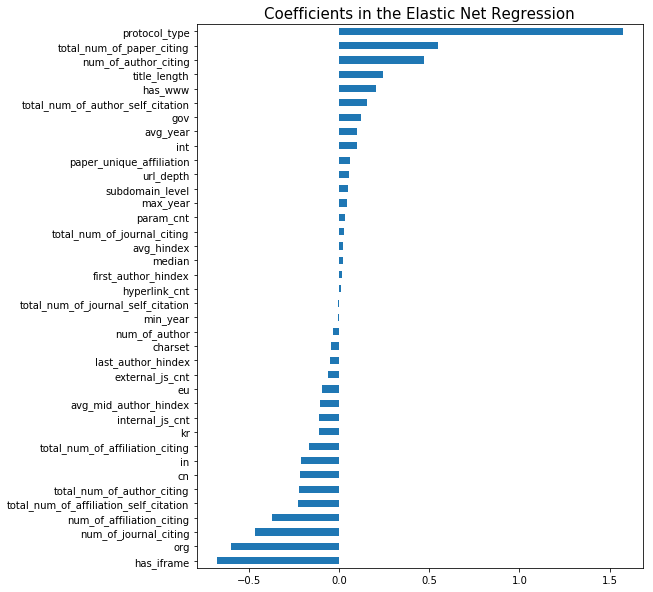

In [15]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Elastic Net Regression")

#### 2nd Edition - Lasso Regression to Select Features

In [16]:
from sklearn.linear_model import Lasso


start_time = time.time()
param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 19.65 seconds ---


In [17]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [18]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [19]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

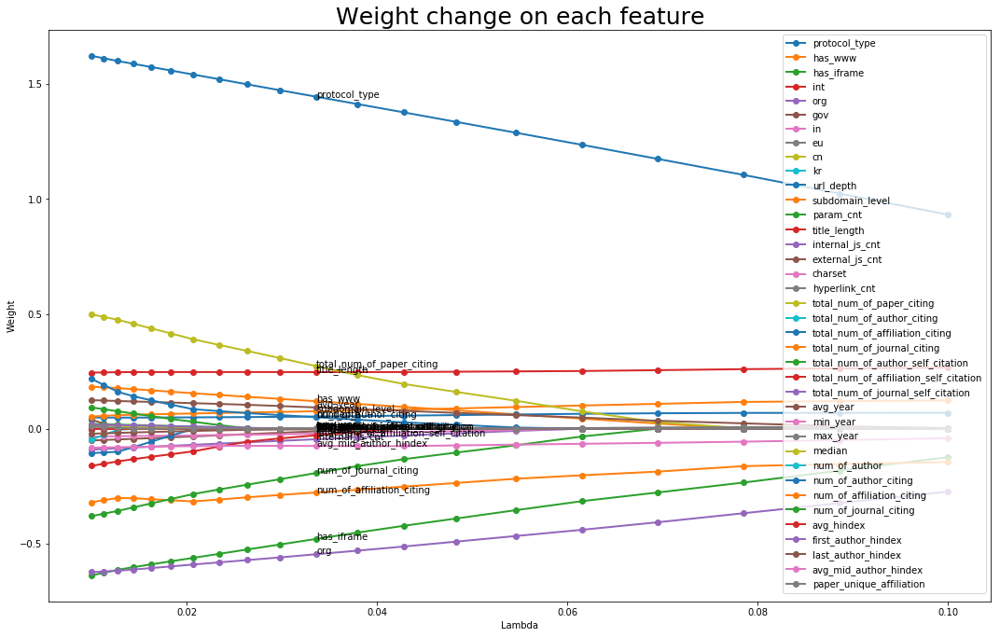

In [20]:
Visualizer.plot_importance_trending(X_train, performance_matrix, 'Weight change on each feature', 10)

In [21]:
start_time = time.time()
param_lso = {
    'alpha': [0.035],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 15.25%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9639,0.046,86.646,0.000
protocol_type,1.4359,0.034,42.435,0.000
total_num_of_paper_citing,0.2699,0.085,3.193,0.001
title_length,0.2463,0.014,17.575,0.000
has_www,0.1158,0.030,3.831,0.000
avg_year,0.0906,1.060,0.085,0.932
subdomain_level,0.0769,0.017,4.492,0.000
url_depth,0.0536,0.014,3.873,0.000
num_of_author_citing,0.0424,0.050,0.856,0.392
max_year,0.0005,0.910,0.001,1.000



R^2 on Testing Set: 15.43%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9639,0.070,56.532,0.000
protocol_type,1.4359,0.052,27.823,0.000
total_num_of_paper_citing,0.2699,0.118,2.284,0.022
title_length,0.2463,0.021,11.539,0.000
has_www,0.1158,0.046,2.502,0.012
avg_year,0.0906,1.553,0.058,0.953
subdomain_level,0.0769,0.026,2.925,0.003
url_depth,0.0536,0.021,2.568,0.010
num_of_author_citing,0.0424,0.108,0.391,0.696
max_year,0.0005,1.328,0.000,1.000


--- 00 minutes, 1.24 seconds ---


In [22]:
rpt = result_test.best_result.rpt


In [23]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
num_of_author,0.0,0.033,0.0,1.0
median,0.0,0.018,0.0,1.0
int,0.0,0.111,0.0,1.0
min_year,0.0,0.334,0.0,1.0
avg_hindex,-0.0,0.036,-0.0,1.0
first_author_hindex,0.0,0.022,0.0,1.0
total_num_of_journal_self_citation,0.0,0.019,0.0,1.0
total_num_of_author_self_citation,0.0,0.033,0.0,1.0
total_num_of_journal_citing,0.0,0.127,0.0,1.0
total_num_of_affiliation_citing,-0.0,0.079,-0.0,1.0


In [24]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
title_length,0.2463,0.021,11.539,0.000
num_of_journal_citing,-0.1928,0.046,-4.203,0.000
org,-0.5419,0.048,-11.181,0.000
protocol_type,1.4359,0.052,27.823,0.000
has_iframe,-0.4713,0.054,-8.770,0.000
Constant,3.9639,0.070,56.532,0.000
num_of_affiliation_citing,-0.2700,0.071,-3.796,0.000
subdomain_level,0.0769,0.026,2.925,0.003
avg_mid_author_hindex,-0.0752,0.026,-2.879,0.004
url_depth,0.0536,0.021,2.568,0.010


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

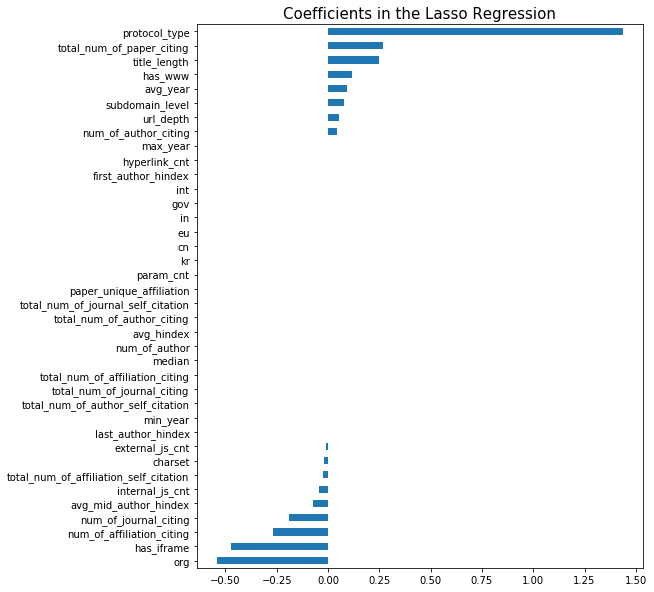

In [25]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train.columns, 
    "Coefficients in the Lasso Regression")

#### 3rd Edition - Use Selected Features to run Lasso Regression Again

- Manually select features

In [26]:
features = set(tuple([
    'org',
    'gov',
    'int',
    'in',
    'cn',
    'eu',
]))

for col_name in rpt[rpt.Coefficients != 0].index.tolist():
    features.add(col_name)

features.remove('Constant')

In [27]:
features

{'avg_mid_author_hindex',
 'avg_year',
 'charset',
 'cn',
 'eu',
 'external_js_cnt',
 'gov',
 'has_iframe',
 'has_www',
 'in',
 'int',
 'internal_js_cnt',
 'last_author_hindex',
 'max_year',
 'num_of_affiliation_citing',
 'num_of_author_citing',
 'num_of_journal_citing',
 'org',
 'protocol_type',
 'subdomain_level',
 'title_length',
 'total_num_of_affiliation_self_citation',
 'total_num_of_paper_citing',
 'url_depth'}

In [28]:
start_time = time.time()
param_lso = {
    'alpha': sorted(np.logspace(-2, -1, 20)),
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 00 minutes, 13.43 seconds ---


In [29]:
performance_matrix = build_visualization_matrix(result_train, result_test)

<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

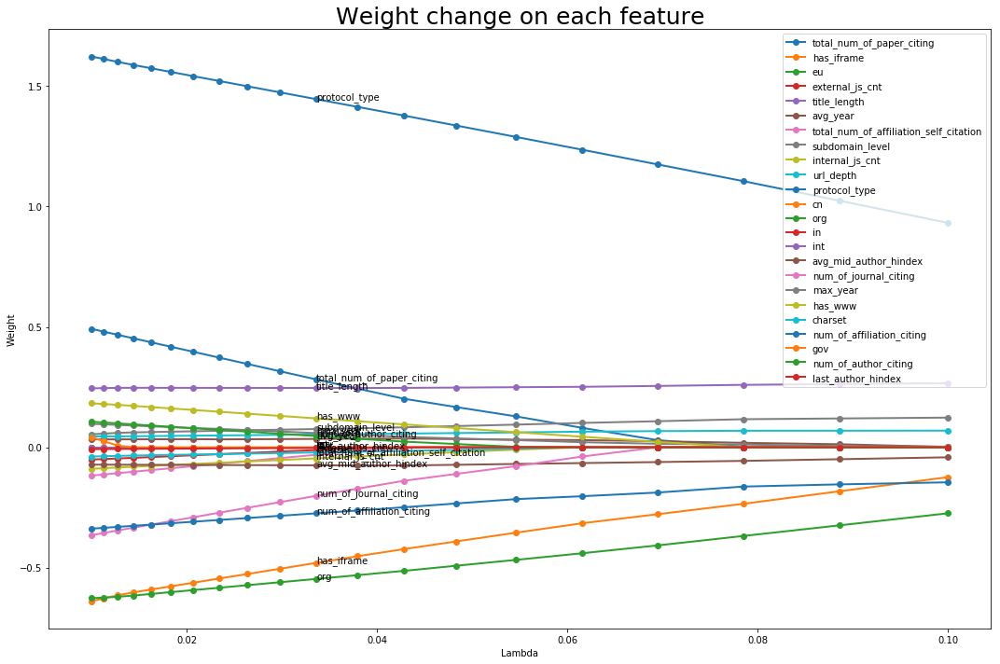

In [30]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [31]:
start_time = time.time()
param_lso = {
    'alpha': [0.035],
    'max_iter': np.arange(10,80,40),
}


lso = Lasso(random_state=seed)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_lso) \
    .set_engine(lso) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 15.25%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9640,0.046,86.801,0.000
protocol_type,1.4355,0.034,42.458,0.000
total_num_of_paper_citing,0.2693,0.028,9.704,0.000
title_length,0.2463,0.014,17.602,0.000
has_www,0.1163,0.030,3.854,0.000
subdomain_level,0.0766,0.017,4.493,0.000
max_year,0.0563,0.713,0.079,0.937
url_depth,0.0535,0.014,3.900,0.000
num_of_author_citing,0.0433,0.018,2.419,0.016
avg_year,0.0349,0.713,0.049,0.961



R^2 on Testing Set: 15.43%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9640,0.070,56.695,0.000
protocol_type,1.4355,0.052,27.847,0.000
total_num_of_paper_citing,0.2693,0.043,6.293,0.000
title_length,0.2463,0.021,11.565,0.000
has_www,0.1163,0.046,2.517,0.012
subdomain_level,0.0766,0.026,2.927,0.003
max_year,0.0563,1.038,0.054,0.957
url_depth,0.0535,0.021,2.584,0.010
num_of_author_citing,0.0433,0.029,1.483,0.138
avg_year,0.0349,1.038,0.034,0.973


--- 00 minutes, 0.75 seconds ---


In [32]:
rpt = result_test.best_result.rpt


In [33]:
rpt[rpt.Coefficients == 0]

,Coefficients,Standard Errors,t values,Probabilities
in,-0.0,0.338,-0.0,1.0
gov,0.0,0.061,0.0,1.0
int,0.0,0.111,0.0,1.0
cn,-0.0,0.268,-0.0,1.0
eu,-0.0,0.159,-0.0,1.0


In [34]:
rpt.sort_values(by=['Probabilities', 'Standard Errors'])

,Coefficients,Standard Errors,t values,Probabilities
avg_mid_author_hindex,-0.0752,0.019,-3.867,0.000
title_length,0.2463,0.021,11.565,0.000
num_of_affiliation_citing,-0.2717,0.034,-8.012,0.000
num_of_journal_citing,-0.1915,0.040,-4.756,0.000
total_num_of_paper_citing,0.2693,0.043,6.293,0.000
org,-0.5419,0.048,-11.233,0.000
protocol_type,1.4355,0.052,27.847,0.000
has_iframe,-0.4714,0.054,-8.796,0.000
Constant,3.9640,0.070,56.695,0.000
subdomain_level,0.0766,0.026,2.927,0.003


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

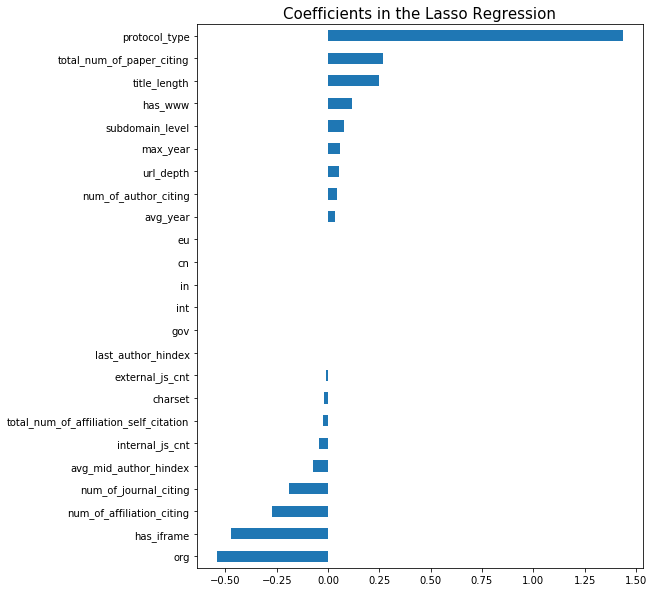

In [35]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train[features].columns, 
    "Coefficients in the Lasso Regression")

#### 4th Edition - Retrain the Elastic Net Regressor with Selected Features

In [36]:
features = rpt[rpt.Coefficients != 0].index.tolist()[1:]
features

['protocol_type',
 'total_num_of_paper_citing',
 'title_length',
 'has_www',
 'subdomain_level',
 'max_year',
 'url_depth',
 'num_of_author_citing',
 'avg_year',
 'last_author_hindex',
 'external_js_cnt',
 'charset',
 'total_num_of_affiliation_self_citation',
 'internal_js_cnt',
 'avg_mid_author_hindex',
 'num_of_journal_citing',
 'num_of_affiliation_citing',
 'has_iframe',
 'org']

In [37]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(VerboseGridSearchStrategy) \
    .build()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

--- 01 minutes, 5.78 seconds ---


In [38]:
performance_matrix = build_visualization_matrix(result_train, result_test)

In [39]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'mse', 'type', 'MSE Trending on Train/Test Set')


In [40]:
Visualizer.plot_loss_trend(performance_matrix, 'alpha', 'r_2', 'type', 'Adjust R^2 Trending on Train/Test Set')


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

<Figure size 576x720 with 0 Axes>

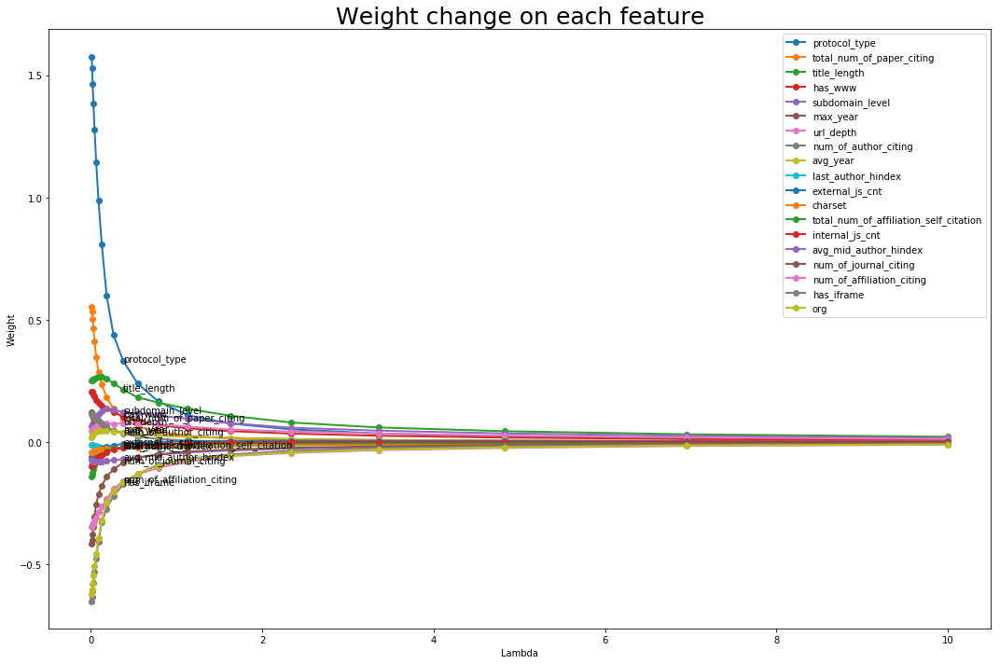

In [41]:
Visualizer.plot_importance_trending(X_train[features], performance_matrix, 'Weight change on each feature', 10)

In [42]:
start_time = time.time()
param_en = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'alpha': sorted(np.logspace(-2, 1, 20)),
    'max_iter': np.arange(10,80,40),
}


en = ElasticNet(random_state=seed,
                       warm_start=False,
)


# Start to train model
result_train, result_test = AnalysisEngineBuilder() \
    .set_X_train(X_train[features]) \
    .set_y_train(y_train) \
    .set_X_test(X_test[features]) \
    .set_y_test(y_test) \
    .set_param_grid(param_en) \
    .set_engine(en) \
    .set_train_strategy(GridSearchStrategy) \
    .build()

result_train.best_result.show_performance()
print()
result_test.best_result.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

R^2 on Training Set: 16.16%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9774,0.045,87.903,0.000
protocol_type,1.5752,0.033,47.135,0.000
total_num_of_paper_citing,0.5636,0.028,20.425,0.000
title_length,0.2520,0.014,18.534,0.000
has_www,0.2080,0.030,6.962,0.000
max_year,0.1409,0.709,0.199,0.842
num_of_author_citing,0.1056,0.018,5.929,0.000
subdomain_level,0.0628,0.016,3.863,0.000
url_depth,0.0443,0.013,3.303,0.001
avg_year,0.0013,0.708,0.002,0.998



R^2 on Testing Set: 16.21%


,Coefficients,Standard Errors,t values,Probabilities
Constant,3.9774,0.069,57.326,0.000
protocol_type,1.5752,0.051,30.915,0.000
total_num_of_paper_citing,0.5636,0.043,13.238,0.000
title_length,0.2520,0.021,12.163,0.000
has_www,0.2080,0.046,4.545,0.000
max_year,0.1409,1.032,0.137,0.891
num_of_author_citing,0.1056,0.029,3.632,0.000
subdomain_level,0.0628,0.025,2.518,0.012
url_depth,0.0443,0.020,2.180,0.029
avg_year,0.0013,1.032,0.001,0.999


--- 01 minutes, 10.92 seconds ---


<module 'matplotlib.pyplot' from '/home/jjian03/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py'>

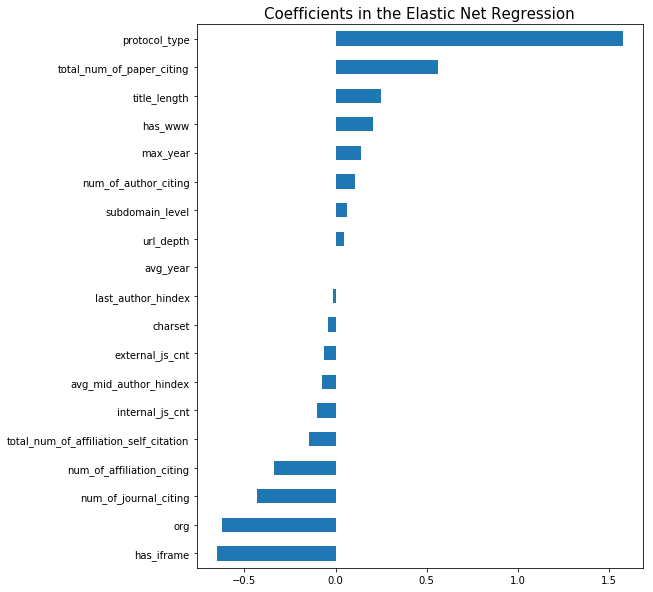

In [43]:
Visualizer.plot_feature_importance(
    result_train.best_result.model.coef_, X_train[features].columns, 
    "Coefficients in the Elastic Net Regression")